In [1]:
from glob import glob
import os
import scanpy as sc
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import matplotlib as mpl

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/celltypes_hln/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

# Load

In [3]:
adata = sc.read_h5ad('/stanley/WangLab/kamal/data/technologies/xenium/human_lymph_node/filtered/adata.h5ad')
adata.obsm['spatial'][:,1] *= -1

In [4]:
adata

AnnData object with n_obs × n_vars = 377957 × 377
    obs: 'transcript_counts', 'n_genes'
    var: 'n_cells'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'highpass', 'lowpass', 'reversehighpass', 'revershighpass'

In [5]:
adata.X.max()

3.8286414

In [6]:
adata.X.min()

0.0

In [7]:
filter_key = 'celltyping'
max_mag = 2

# Add layer for non-filtered data
adata.layers[filter_key] = adata.X.copy()

# Scale
# sc.pp.filter_cells(adata, min_counts=1)
# sc.pp.normalize_total(adata, layer=filter_key)
# sc.pp.log1p(adata, layer=filter_key)
sc.pp.scale(adata, layer=filter_key)

# # Clip
# X = adata.layers[filter_key]
# X[X > max_mag] = max_mag
# X[X < -max_mag] = -max_mag

In [8]:
# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 4
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))
figsize=(set_width, height*fignorm)

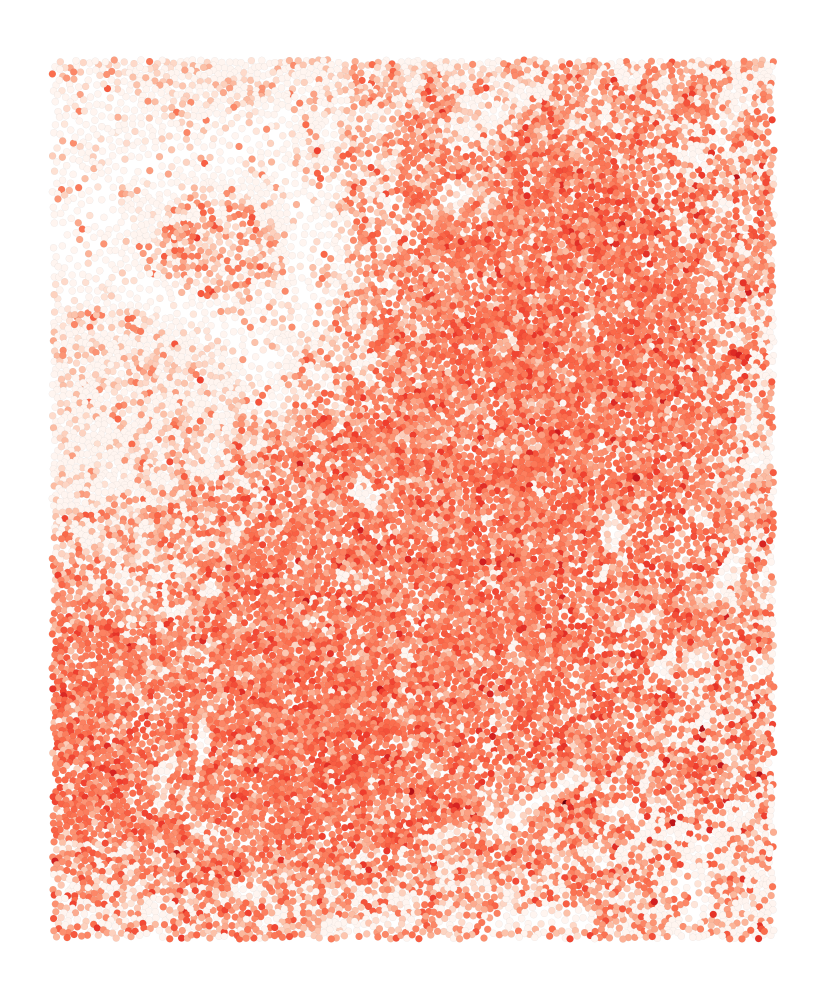

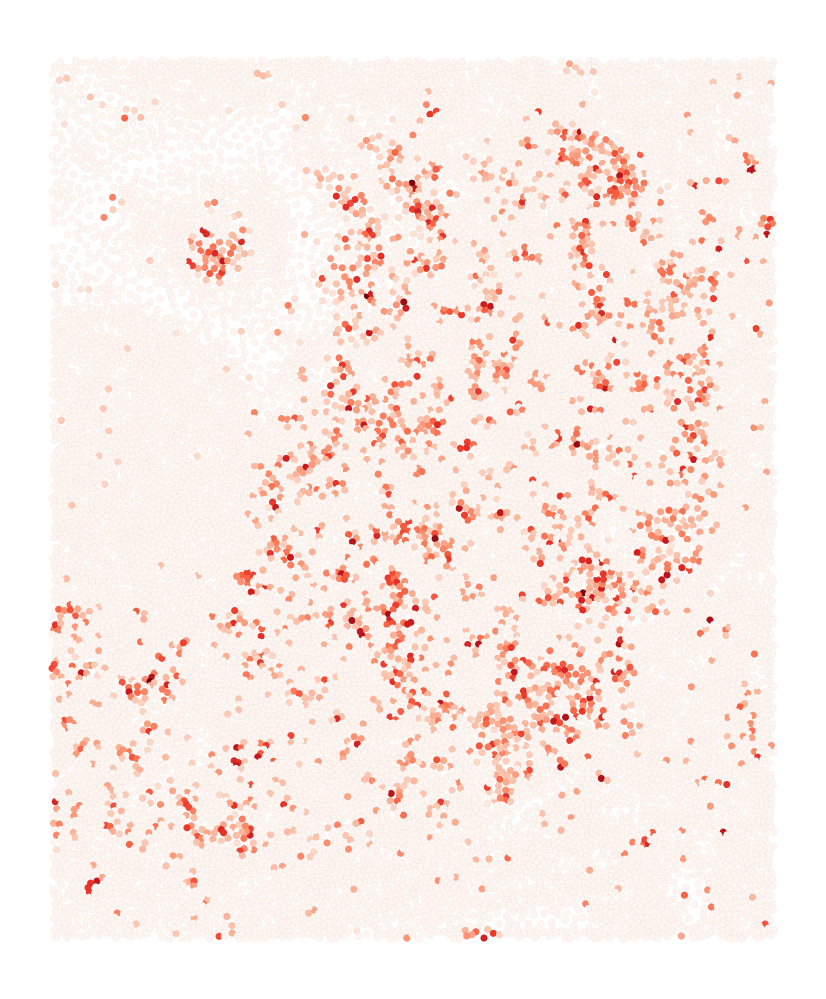

In [9]:
genes = ['TRAC', 'LAMP3']

# Plot zoom of gene expression for sanity check
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = height/8

zoom_x = 2050
zoom_y = -4900

zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

points = zdata.obsm['spatial']

for gene in genes:

    plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
    plt.scatter(
        points[:,0],
        points[:,1],
        edgecolor='k',
        linewidth=0.01,
        s=10,
        # c=np.array(zdata[:,gene].X.todense()).flatten(),
        c=zdata[:,gene].layers[filter_key].flatten(),
        cmap='Reds',
    )
    plt.axis('off')
    # filename = os.path.join(figpath, f'celltypes_zoom.png')
    # plt.savefig(filename, dpi=dpi)
    plt.show()

# Clustering

In [11]:
n_pcs = 10
pca = PCA(n_components=n_pcs, random_state=0)
adata.obsm[f'X_pca_{filter_key}'] = pca.fit_transform(adata.layers[filter_key])
# adata.obsm[f'X_pca_{filter_key}'] = pca.fit_transform(np.array(adata.layers[filter_key].todense()))
adata.varm[f'X_pca_{filter_key}'] = pca.components_.T

In [12]:
# n_celltypes = 8
# kmeans = KMeans(n_clusters=n_celltypes, random_state=0)
# kmeans.fit(adata.obsm[f'X_pca_{filter_key}'])
# adata.obs['celltype'] = kmeans.labels_.astype(str)

In [13]:
sc.pp.neighbors(adata, use_rep=f'X_pca_{filter_key}')

In [34]:
# sc.tl.leiden(adata, resolution=0.5, key_added='celltype', flavor='igraph', n_iterations=3, random_state=0)
# sc.tl.leiden(adata, resolution=0.3, key_added='celltype', flavor='leidenalg', random_state=0, n_iterations=2) # 11 clusters tho
sc.tl.leiden(adata, resolution=0.25, key_added='celltype', flavor='leidenalg', random_state=0, n_iterations=2) # 7 clusters

## Plot markers

In [35]:
sc.tl.rank_genes_groups(adata, groupby='celltype', layer=filter_key)
sc.tl.dendrogram(adata, groupby='celltype', use_rep=f'X_pca_{filter_key}')

/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmah

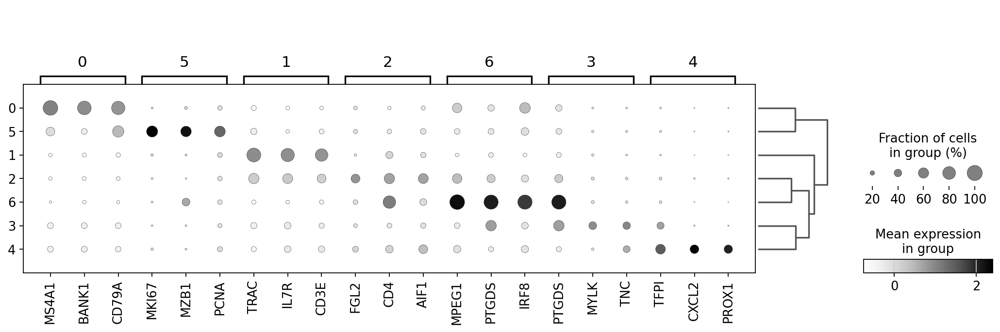

In [36]:
fig = plt.figure(figsize=(16,4.5))
ax = plt.gca()
sc.pl.rank_genes_groups_dotplot(adata, groupby='celltype', n_genes=3, layer=filter_key, ax=ax, cmap='Greys')
figname = 'celltype_markers.png'
savepath = os.path.join(figpath, figname)
fig.savefig(savepath, dpi=dpi, bbox_inches='tight')

## Plot tissue

In [47]:
palette = sc.pl.palettes.default_102

celltype2color = {
    '0': palette[1], # B-cell 1
    '1': palette[0], # T-cell
    '2': palette[3], # Dendritic 1
    '3': palette[6], # Macrophage
    '4': palette[4], # LEC
    '5': palette[5], # B-cell 2
    '6': palette[2], # Plasmacytoid
    # '7': palette[7], # Vasc
    # '8': palette[8], # Vasc
    # '9': palette[9], # Vasc
    # '10': palette[10], # Vasc
}

adata.obs['celltype_colors'] = adata.obs['celltype'].map(celltype2color)

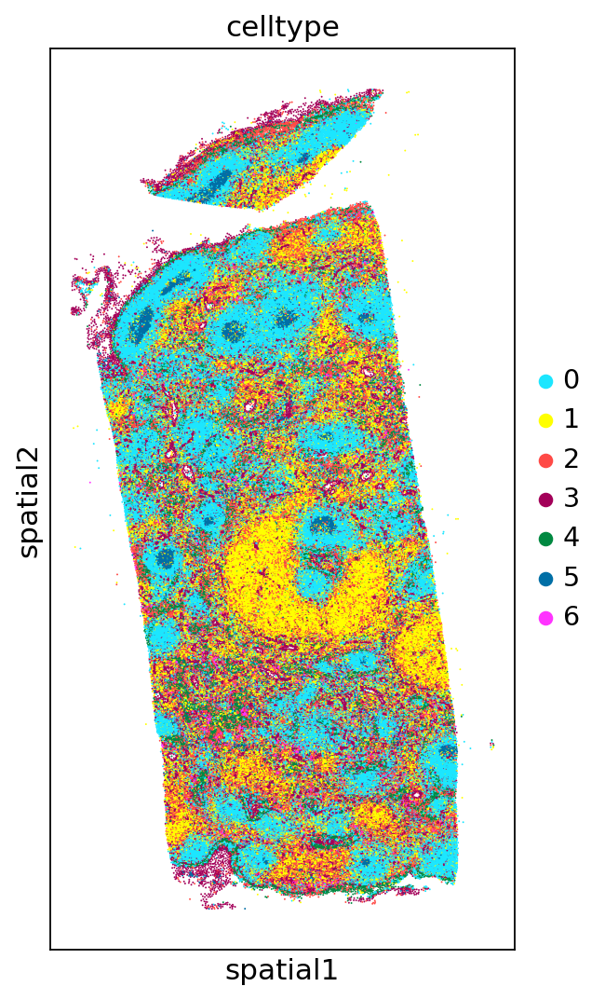

In [48]:
sc.pl.embedding(
    adata,
    basis='spatial',
    color='celltype',
    palette=celltype2color,
    s=3,
)

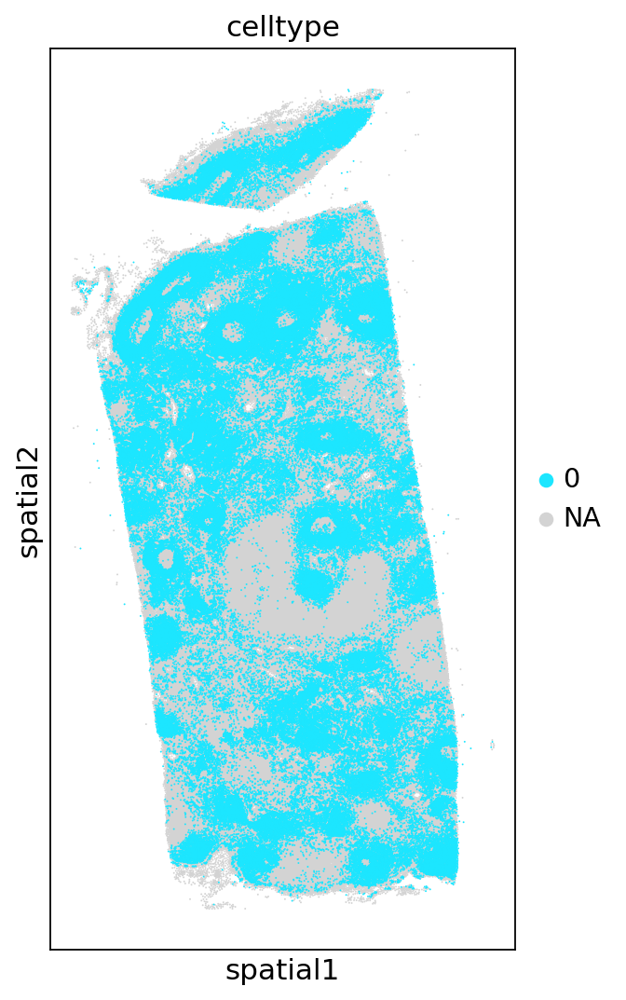

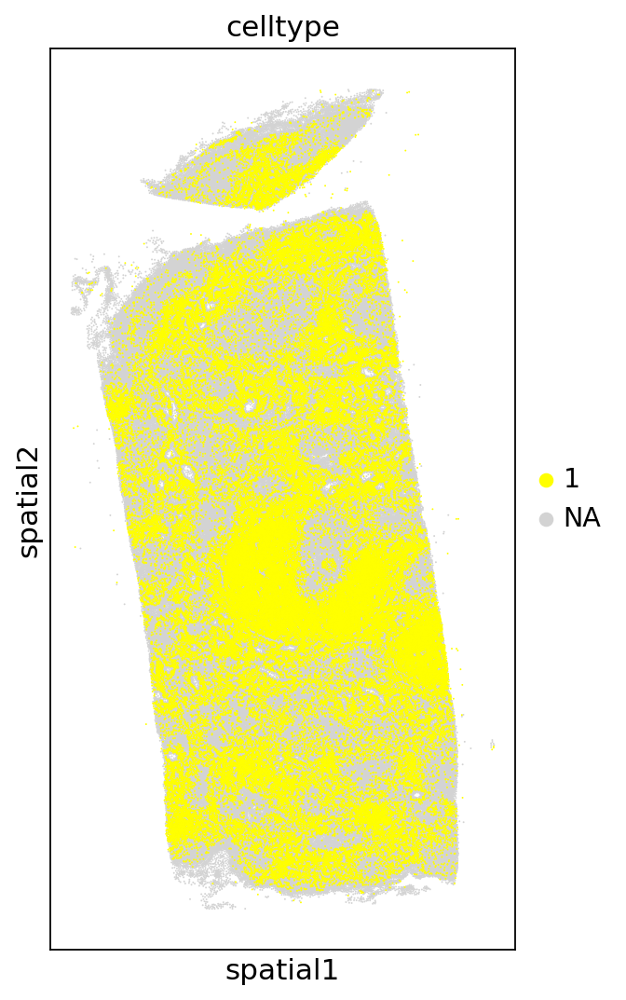

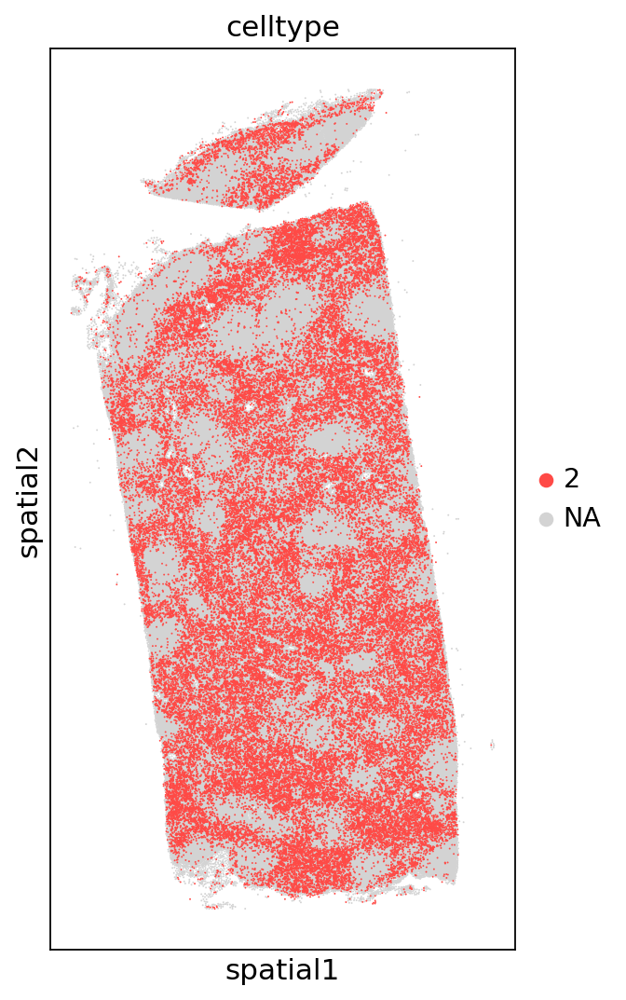

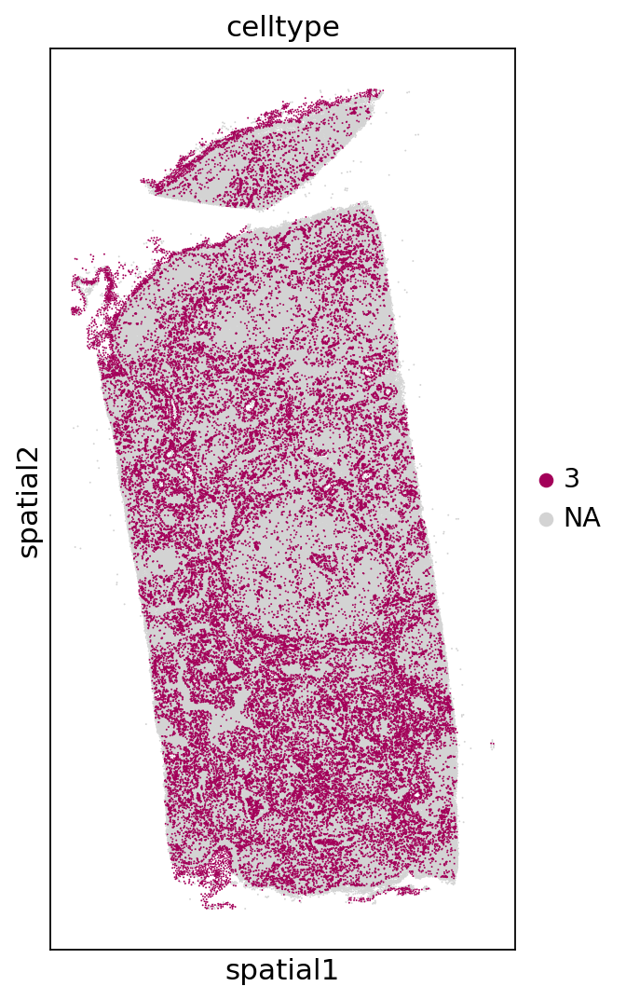

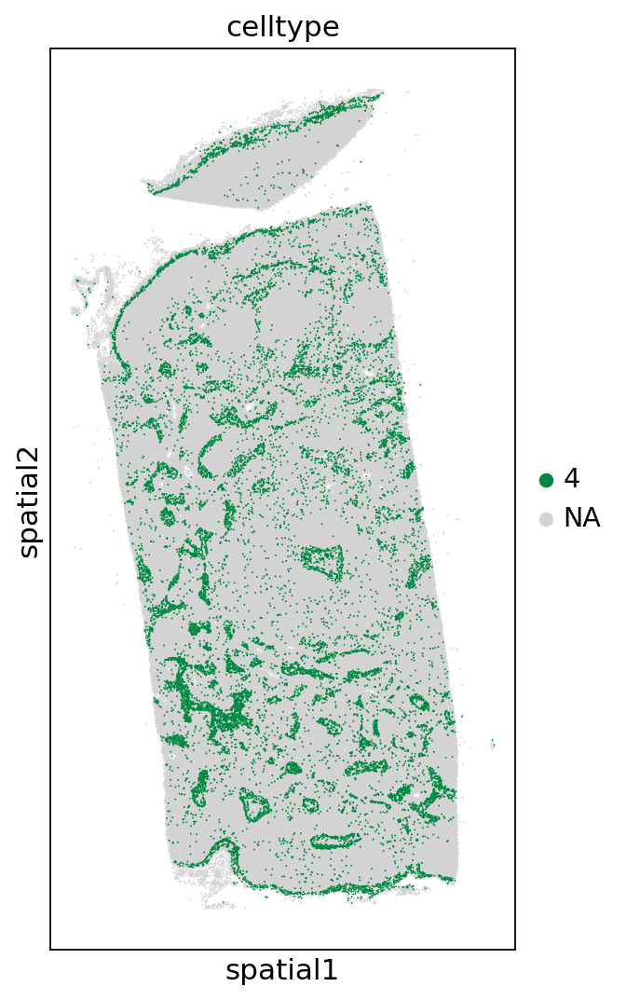

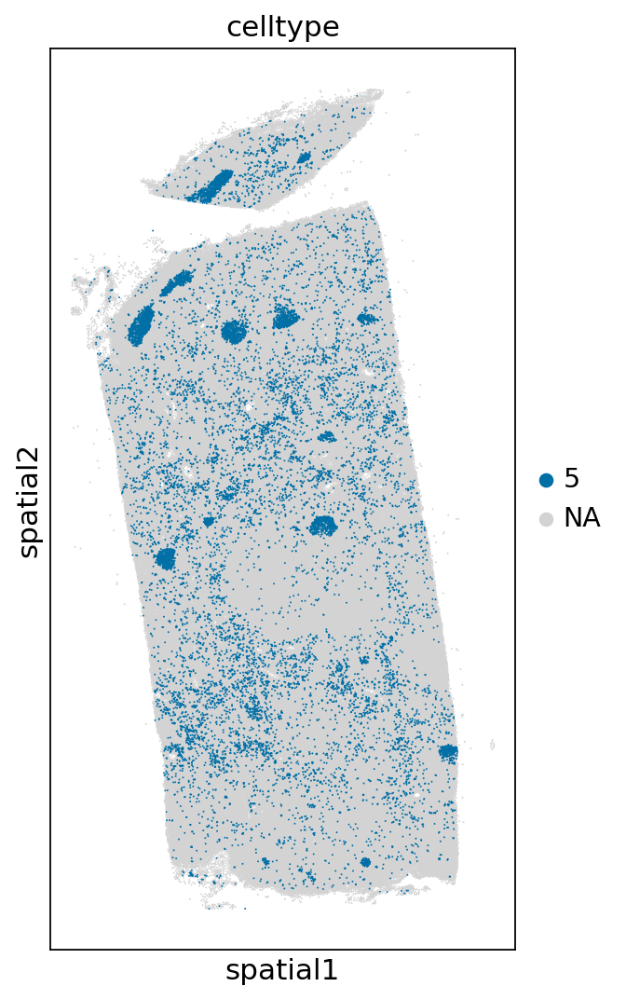

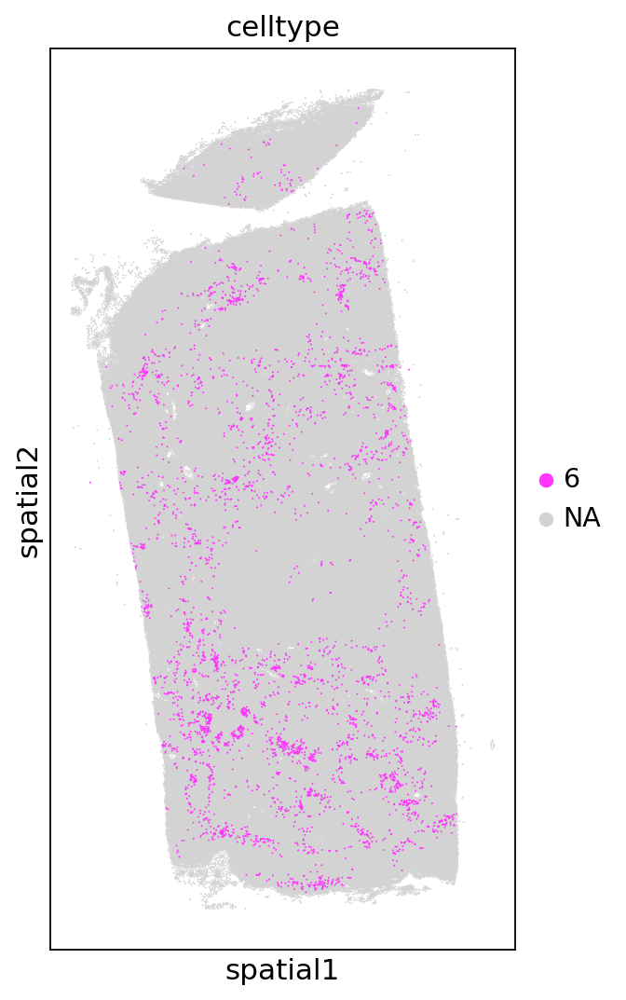

In [50]:
n_celltypes = len(adata.obs['celltype'].unique())

for i in range(n_celltypes):

    celltype = str(i)

    sc.pl.embedding(
        adata,
        basis='spatial',
        color='celltype',
        palette=celltype2color,
        s=3,
        groups=celltype,
    )

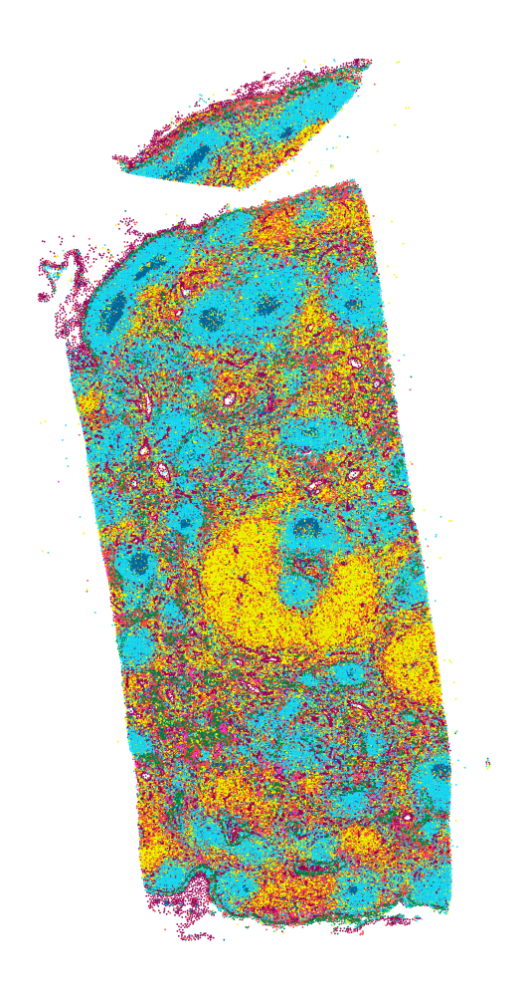

In [51]:
points = adata.obsm['spatial']
plt.figure(figsize=(4,8))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=0.6,
    c=adata.obs['celltype_colors'],
)
plt.axis('off')
filename = os.path.join(figpath, f'celltypes.png')
plt.savefig(filename, dpi=dpi)
plt.show()

# Zoom 1

In [52]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = height/8

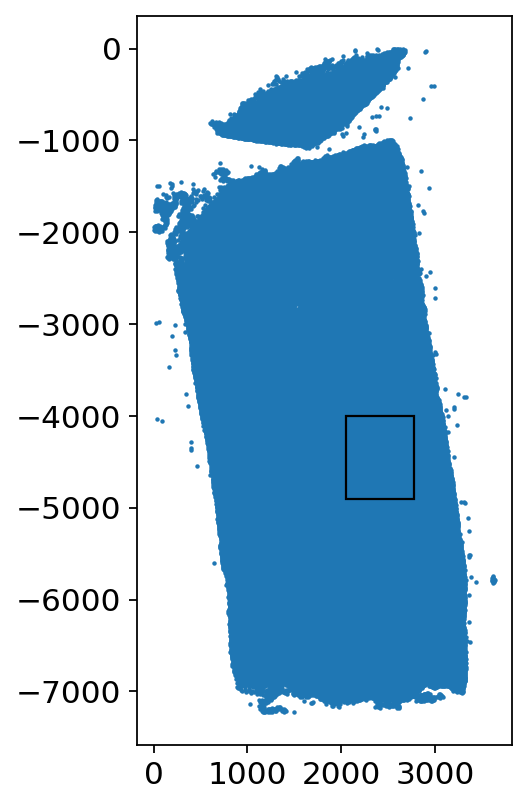

In [53]:
zoom_x = 2050
zoom_y = -4900

plt.figure(figsize=(3,6))
plt.scatter(*adata.obsm['spatial'].T, s=1)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k')
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [54]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

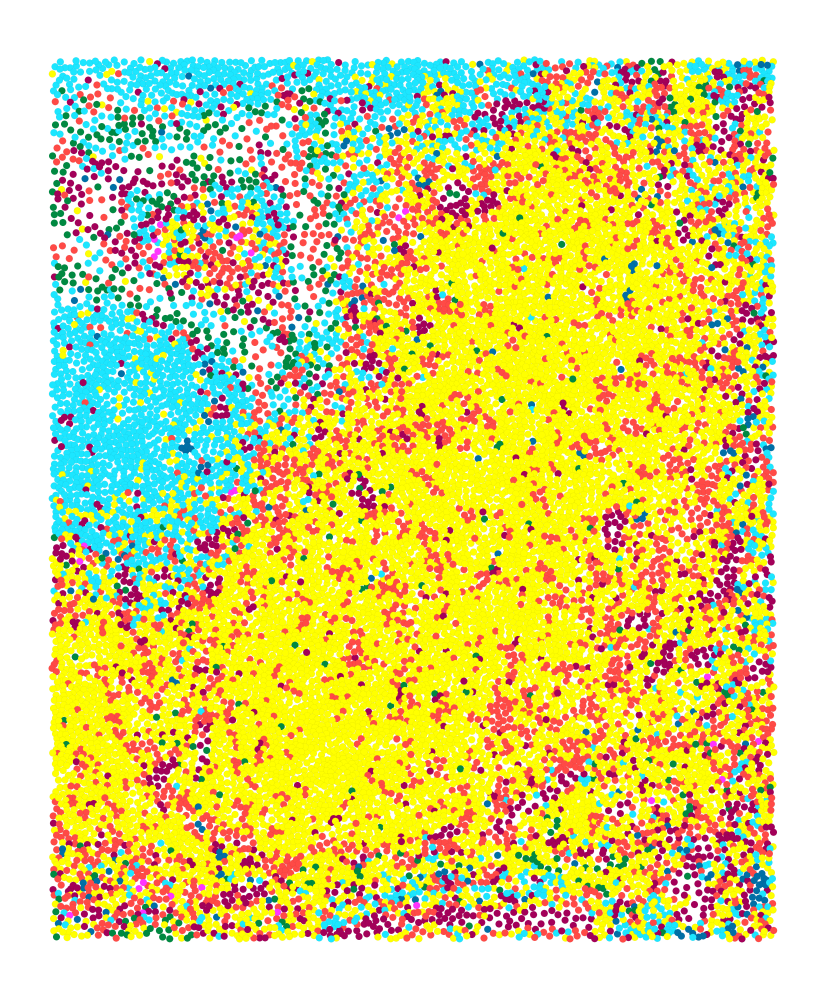

In [55]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=10,
    c=zdata.obs['celltype_colors'],
)
plt.axis('off')
filename = os.path.join(figpath, f'celltypes_zoom.png')
plt.savefig(filename, dpi=dpi)
plt.show()

# Zoom 2

In [56]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/12
# zoom_height = height/8
zoom_height = zoom_width * (5/4)

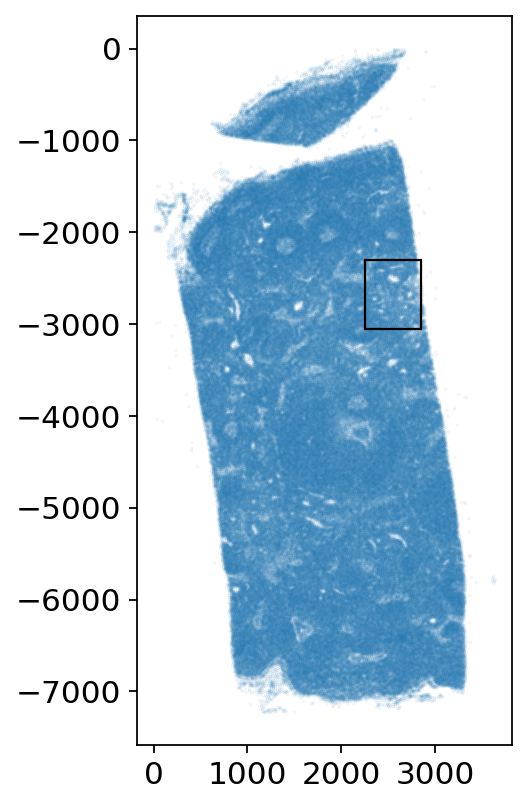

In [57]:
zoom_x = 2250
zoom_y = -3050

plt.figure(figsize=(3,6))
plt.scatter(*adata.obsm['spatial'].T, s=0.001)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [58]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

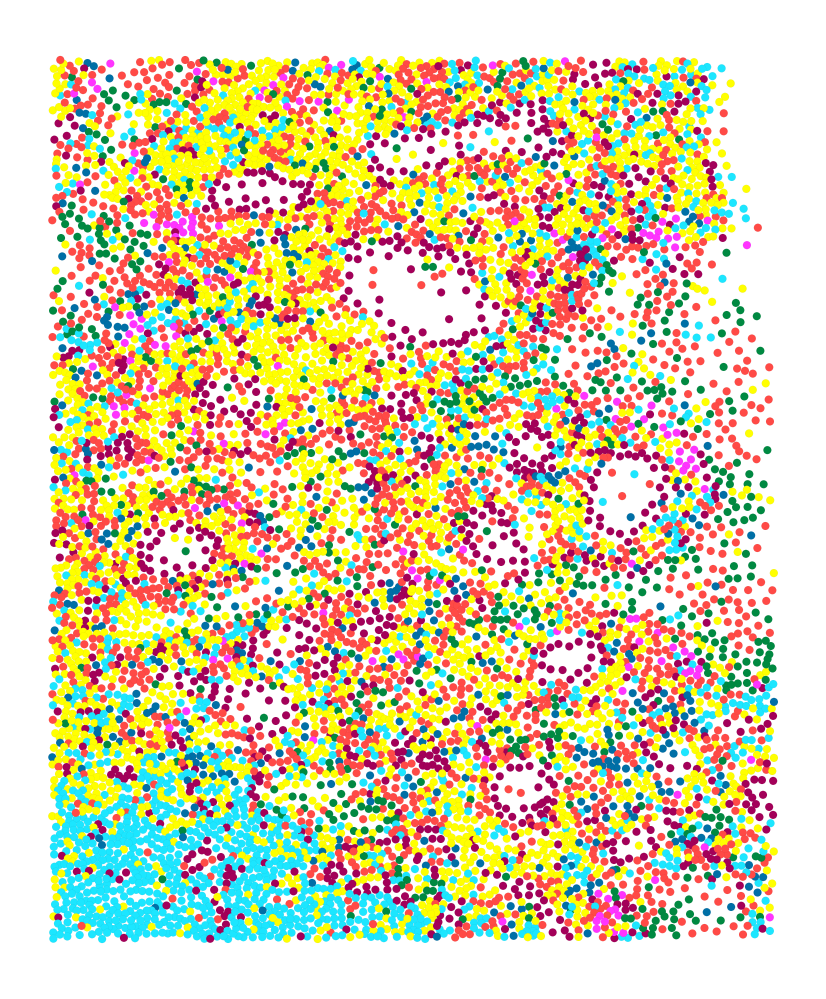

In [59]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=13,
    c=zdata.obs['celltype_colors'],
)
plt.axis('off')
filename = os.path.join(figpath, f'celltypes_zoom2.png')
plt.savefig(filename, dpi=dpi)
plt.show()